In [1]:
# First, compute the camera calibration matrix and distortion coefficients given a set of chessboard images 
# (in the camera_cal folder in the repository).

In [2]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
from datetime import datetime

In [3]:
nx = 9
ny = 6

In [4]:
# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((nx*ny,3), np.float32)
objp[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1,2)

In [5]:
# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')
len(images)

20

In [6]:
# Step through the list and search for chessboard corners
for idx, fname in enumerate(images):
    print(fname)
    st = datetime.now()
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None)
    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)
        # Draw and display the corners
        cv2.drawChessboardCorners(img, (nx,ny), corners, ret)
        write_name = 'camera_cal/corners_found/'+str(idx)+'.jpg'
        cv2.imwrite(write_name, img)
    print('runtime: {}'.format(datetime.now()-st))        

camera_cal/calibration1.jpg
runtime: 0:00:00.239416
camera_cal/calibration10.jpg
runtime: 0:00:00.354158
camera_cal/calibration11.jpg
runtime: 0:00:00.469286
camera_cal/calibration12.jpg
runtime: 0:00:00.223337
camera_cal/calibration13.jpg
runtime: 0:00:00.256390
camera_cal/calibration14.jpg
runtime: 0:00:00.256931
camera_cal/calibration15.jpg
runtime: 0:00:00.258653
camera_cal/calibration16.jpg
runtime: 0:00:00.207461
camera_cal/calibration17.jpg
runtime: 0:00:00.168209
camera_cal/calibration18.jpg
runtime: 0:00:00.171315
camera_cal/calibration19.jpg
runtime: 0:00:00.300857
camera_cal/calibration2.jpg
runtime: 0:00:00.064268
camera_cal/calibration20.jpg
runtime: 0:00:00.452156
camera_cal/calibration3.jpg
runtime: 0:00:00.065756
camera_cal/calibration4.jpg
runtime: 0:00:00.331729
camera_cal/calibration5.jpg
runtime: 0:00:00.265353
camera_cal/calibration6.jpg
runtime: 0:00:00.337900
camera_cal/calibration7.jpg
runtime: 0:00:00.258155
camera_cal/calibration8.jpg
runtime: 0:00:00.267817
c

In [7]:
import pickle
%matplotlib inline

In [8]:
# Test undistortion on an image
testfname = 'camera_cal/calibration3.jpg'
img = cv2.imread(testfname)
img_size = (img.shape[1], img.shape[0])
img_size

(1280, 720)

In [9]:
# Do camera calibration given object points and image points
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)

In [10]:
ret, mtx

(1.1868973603423718,
 array([[  1.15396093e+03,   0.00000000e+00,   6.69705357e+02],
        [  0.00000000e+00,   1.14802496e+03,   3.85656234e+02],
        [  0.00000000e+00,   0.00000000e+00,   1.00000000e+00]]))

In [11]:
# k1, k2, p1, p2, k3. 
# k for radial distortion (curved lenses), p for tangential distortion (image plane not alingned with lens)
dist

array([[ -2.41017956e-01,  -5.30721173e-02,  -1.15810355e-03,
         -1.28318856e-04,   2.67125290e-02]])

In [12]:
dst = cv2.undistort(img, mtx, dist, None, mtx)
cv2.imwrite('camera_cal/test_undist.jpg',dst)

True

In [13]:
# Save the camera calibration result for later use (we won't worry about rvecs / tvecs)
dist_pickle = {}
dist_pickle["mtx"] = mtx
dist_pickle["dist"] = dist
pickle.dump( dist_pickle, open( "calibration_pickle.p", "wb" ) )

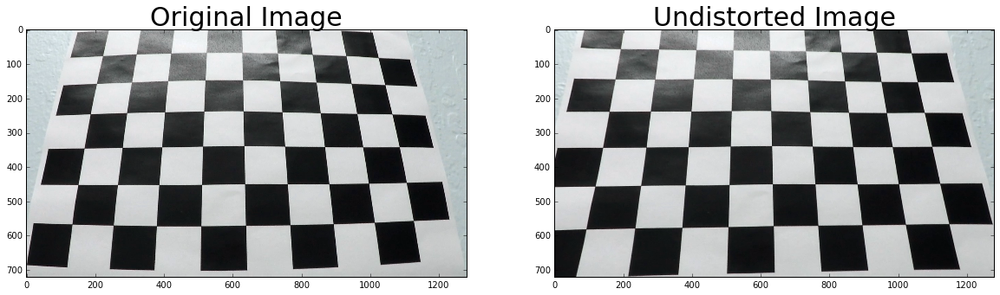

In [14]:
# Visualize undistortion
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10));
ax1.imshow(img);
ax1.set_title('Original Image', fontsize=30);
ax2.imshow(dst);
ax2.set_title('Undistorted Image', fontsize=30);

In [15]:
import matplotlib.image as mpimg

In [16]:
#Next, for a series of test images (in the test_images folder in the repository):
#
#Apply the distortion correction to the raw image.
#Use color transforms, gradients, etc., to create a thresholded binary image.
#Apply a perspective transform to rectify binary image ("birds-eye view").
#Detect lane pixels and fit to find lane boundary.
#Determine curvature of the lane and vehicle position with respect to center.
#Warp the detected lane boundaries back onto the original image.
#Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.


In [17]:
image = mpimg.imread('test_images/test5.jpg')

In [18]:
#Apply the distortion correction to the raw image.
# inputs:
#   img  -- input image
#   mtx  -- camera matrix from calibrateCamera
#   dist -- distortion coefficients from calibrateCamera
def undistort(img, mtx, dist):
    dst = cv2.undistort(img, mtx, dist, None, mtx)
    return dst

In [19]:
undist = undistort(image, mtx, dist)
cv2.imwrite('test_images/test5_undist.jpg',undist)

True

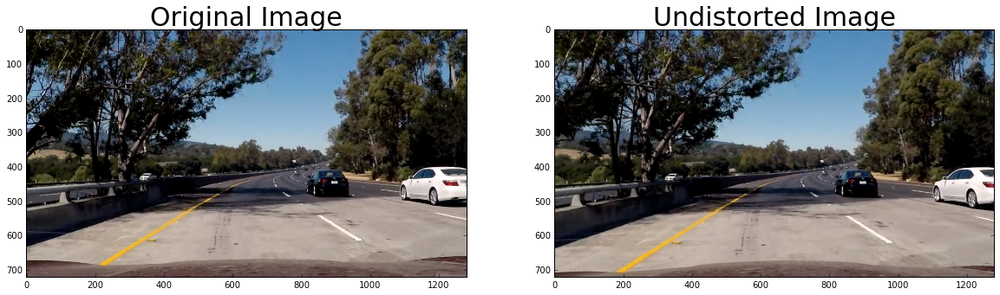

In [20]:
# Visualize undistortion
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10));
ax1.imshow(image);
ax1.set_title('Original Image', fontsize=30);
ax2.imshow(undist);
ax2.set_title('Undistorted Image', fontsize=30);

In [21]:
image = undist

In [22]:
# Apply Sobel along x or y axis to img.
# Then takes an absolute value and apply thresholds.
# Returns binary image.
#   inputs
#     img          -- input image
#     orient       -- 'x' or 'y'
#     kernel_size  -- sobel operator kernel size, in px
#     thresholds   -- two values for low and high thresholds
def sobel_abs_thresholds(img, orient='x', kernel_size=3, thresholds=(0, 255)):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    if orient == 'x':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=kernel_size)
    else:
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=kernel_size)
    abs_sobel = np.absolute(sobel)
    scaled_sobel = np.uint8(255*abs_sobel / np.max(abs_sobel))
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= thresholds[0]) & (scaled_sobel <= thresholds[1])] = 1
    return binary_output

In [23]:
# Applies Sobel along x and y.
# Computes the magnitude of the gradient and applies thresholds.
# Returns binary image.
#   inputs
#     img          -- input image
#     kernel_size  -- sobel operator kernel size, in px
#     thresholds   -- two values for low and high thresholds
def sobel_magnitude_thresholds(img, kernel_size=3, thresholds=(0, 255)):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=kernel_size)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=kernel_size)
    abs_sobel = np.sqrt(sobelx**2 + sobely**2)
    scaled_sobel = np.uint8(255*abs_sobel / np.max(abs_sobel))
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= thresholds[0]) & (scaled_sobel <= thresholds[1])] = 1
    return binary_output

In [24]:
# Applies Sobel along x and y, then computes the direction of the gradient for absolute sobel values.
# Applies thresholds.
# Returns binary image.
#   inputs
#     img          -- input image
#     kernel_size  -- sobel operator kernel size, in px
#     thresholds   -- two values for low and high thresholds
def sobel_graddir_thresholds(img, kernel_size=3, thresholds=(0., np.pi/2)):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=kernel_size)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=kernel_size)
    sobel_grad = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output = np.zeros_like(sobel_grad).astype(np.uint8)
    binary_output[(sobel_grad >= thresholds[0]) & (sobel_grad <= thresholds[1])] = 1
    return binary_output

In [25]:
# Converts image to HLS color space.
# Applies thresholds to the S-channel.
# Returns binary image.
#   inputs
#     img          -- input image
#     thresholds   -- two values for low and high thresholds
def hls_s_thresholds(img, thresholds=(0, 255)):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS) 
    s = hls[:,:,2]
    binary_output = np.zeros_like(s)
    binary_output[(s >= thresholds[0]) & (s <= thresholds[1])] = 1
    return binary_output

In [26]:
sx_kernel = 3
sx_thresh = (20, 100)
sx_binary = sobel_abs_thresholds(image, orient='x', kernel_size=sx_kernel, thresholds=sx_thresh)

sy_kernel = 3
sy_thresh = (30, 100)
sy_binary = sobel_abs_thresholds(image, orient='y', kernel_size=sy_kernel, thresholds=sy_thresh)

smag_kernel = 5
smag_thresh = (30,100)
smag_binary = sobel_magnitude_thresholds(image, kernel_size=smag_kernel, thresholds=smag_thresh)

sgraddir_kernel = 7
sgraddir_thresh = (0.7, 1.3)
sgraddir_binary = sobel_graddir_thresholds(image, kernel_size=sgraddir_kernel, thresholds=sgraddir_thresh)

s_thresh = (170,255)
s_binary = hls_s_thresholds(image, thresholds=s_thresh)

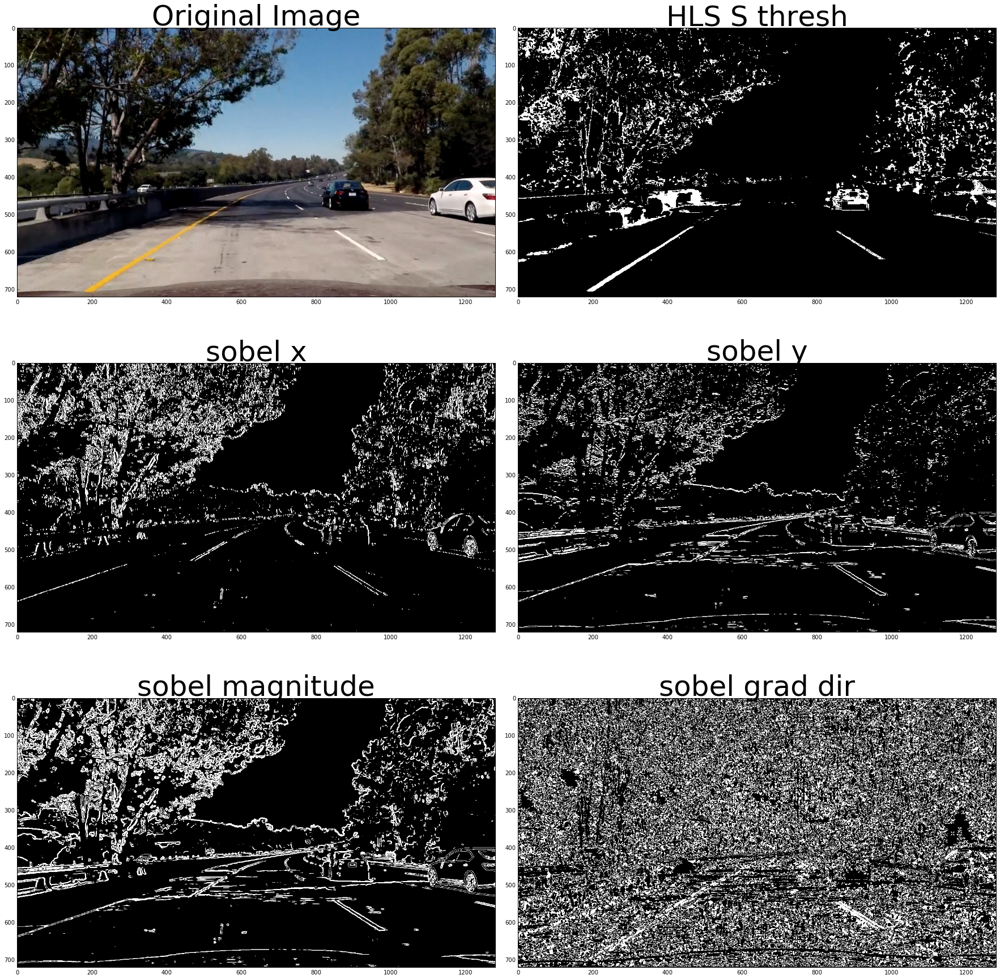

In [27]:
f, ((ax1, ax2), (ax3, ax4), (ax5, ax6)) = plt.subplots(3, 2, figsize=(24, 27))
f.tight_layout()

ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(s_binary, cmap='gray')
ax2.set_title('HLS S thresh', fontsize=50)

ax3.imshow(sx_binary, cmap='gray')
ax3.set_title('sobel x', fontsize=50)
ax4.imshow(sy_binary, cmap='gray')
ax4.set_title('sobel y', fontsize=50)

ax5.imshow(smag_binary, cmap='gray')
ax5.set_title('sobel magnitude', fontsize=50)
ax6.imshow(sgraddir_binary, cmap='gray')
ax6.set_title('sobel grad dir', fontsize=50)

plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [28]:
merge1 = np.dstack(( np.zeros_like(sx_binary), sx_binary, sy_binary)).astype(np.float32)
merge2 = np.dstack(( np.zeros_like(smag_binary), smag_binary, sgraddir_binary)).astype(np.float32)
merge3 = np.dstack(( np.zeros_like(smag_binary), sgraddir_binary, s_binary)).astype(np.float32)


In [29]:
merge1 = np.dstack(( sx_binary, sy_binary, smag_binary)).astype(np.float32)
merge2 = np.dstack(( smag_binary, sgraddir_binary, s_binary)).astype(np.float32)
merge3 = np.dstack(( np.zeros_like(smag_binary), sgraddir_binary, s_binary)).astype(np.float32)


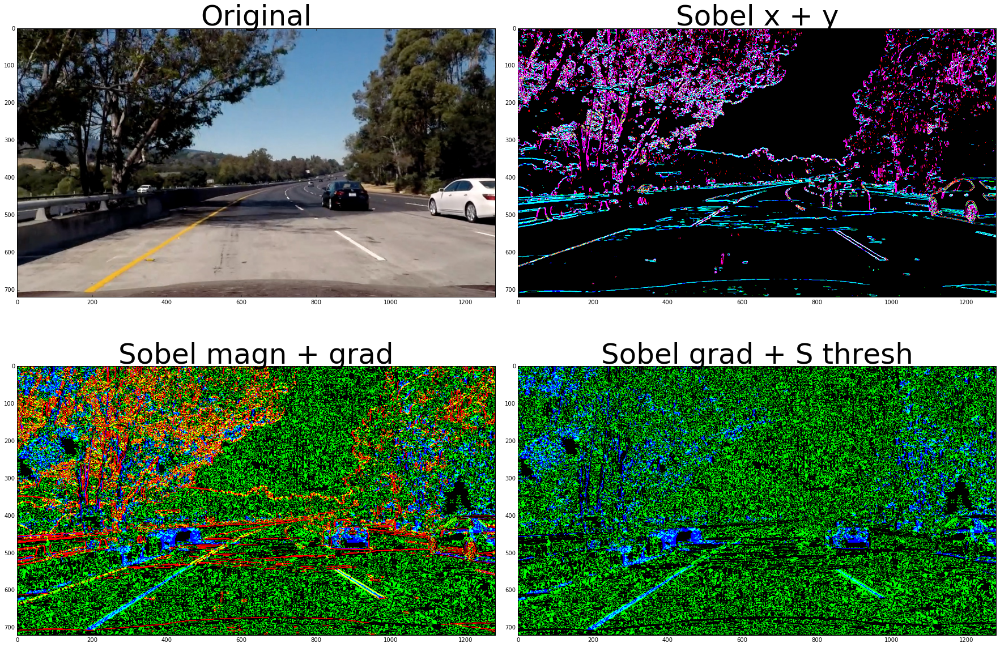

In [30]:
# Plot the result
f, ((ax1, ax2),(ax3, ax4)) = plt.subplots(2, 2, figsize=(24, 18))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original', fontsize=50)
ax2.imshow(merge1)
ax2.set_title('Sobel x + y', fontsize=50)
ax3.imshow(merge2)
ax3.set_title('Sobel magn + grad', fontsize=50)
ax4.imshow(merge3)
ax4.set_title('Sobel grad + S thresh', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [31]:
# x gradient and magnitude
combined0 = np.zeros_like(sx_binary)
combined0[(sx_binary == 1) & (smag_binary == 1)] = 1

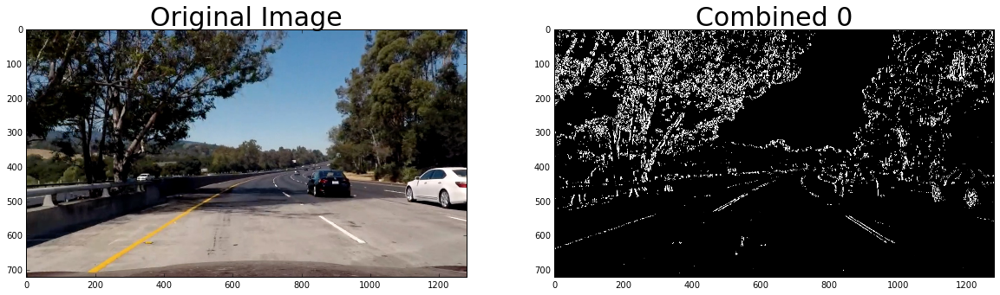

In [32]:
# Visualize combined
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10));
ax1.imshow(image);
ax1.set_title('Original Image', fontsize=30);
ax2.imshow(combined0, cmap='gray');
ax2.set_title('Combined 0', fontsize=30);

In [33]:
# x gradient and S threshold
combined = np.zeros_like(sx_binary)
combined[(s_binary == 1) | (sx_binary == 1)] = 1

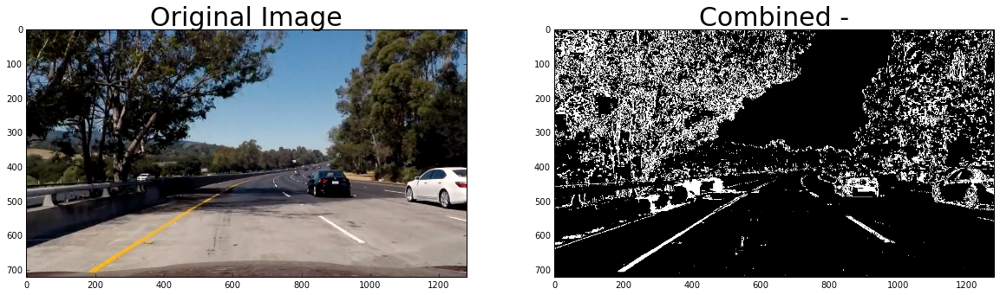

In [34]:
# Visualize combined
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10));
ax1.imshow(image);
ax1.set_title('Original Image', fontsize=30);
ax2.imshow(combined, cmap='gray');
ax2.set_title('Combined -', fontsize=30);

In [35]:
# use previous combined, but add pixels where gradient magnitude and direction are activated
combined2 = np.copy(combined)
combined2[((smag_binary == 1) & (sgraddir_binary == 1))] = 1

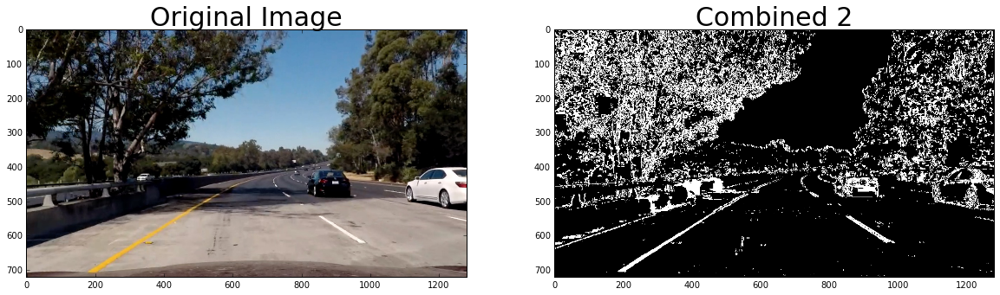

In [36]:
# Visualize combined
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10));
ax1.imshow(image);
ax1.set_title('Original Image', fontsize=30);
ax2.imshow(combined2, cmap='gray');
ax2.set_title('Combined 2', fontsize=30);

In [37]:
# y gradient and grad direction
combined3 = np.zeros_like(sy_binary)
combined3[(sy_binary == 1) & (sgraddir_binary == 1)] = 1

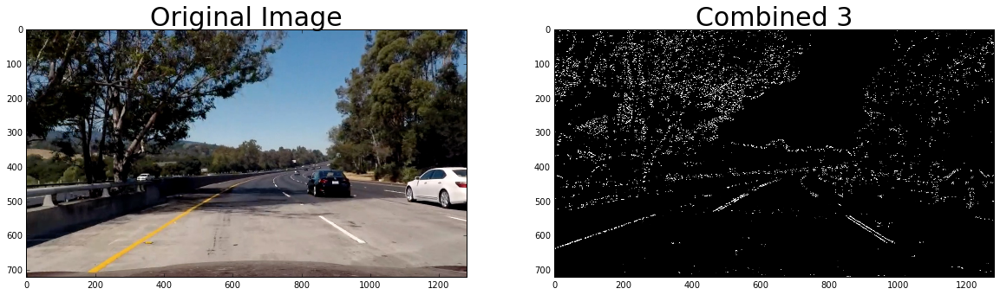

In [38]:
# Visualize combined
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10));
ax1.imshow(image);
ax1.set_title('Original Image', fontsize=30);
ax2.imshow(combined3, cmap='gray');
ax2.set_title('Combined 3', fontsize=30);

In [39]:
# combined2 OR combined3
combined4 = np.copy(combined2)
combined4[combined3 == 1] = 1

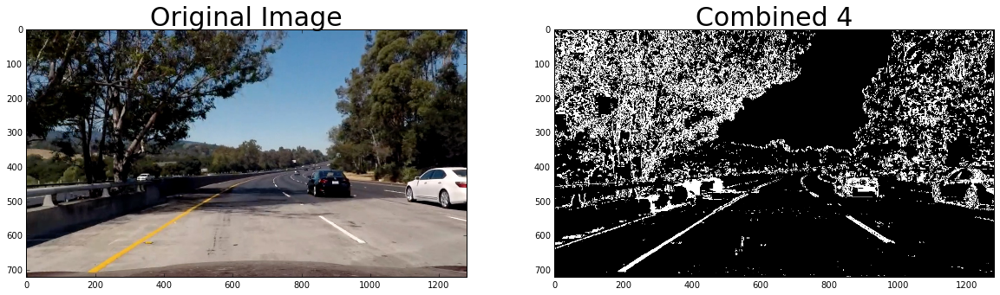

In [40]:
# Visualize combined
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10));
ax1.imshow(image);
ax1.set_title('Original Image', fontsize=30);
ax2.imshow(combined4, cmap='gray');
ax2.set_title('Combined 4', fontsize=30);

In [41]:
# combined4 OR combined0
combined5 = np.copy(combined4)
combined5[combined0 == 1] = 1

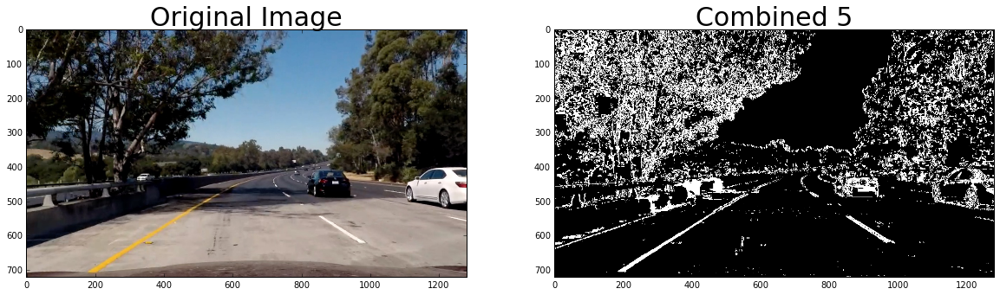

In [42]:
# Visualize combined
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10));
ax1.imshow(image);
ax1.set_title('Original Image', fontsize=30);
ax2.imshow(combined5, cmap='gray');
ax2.set_title('Combined 5', fontsize=30);

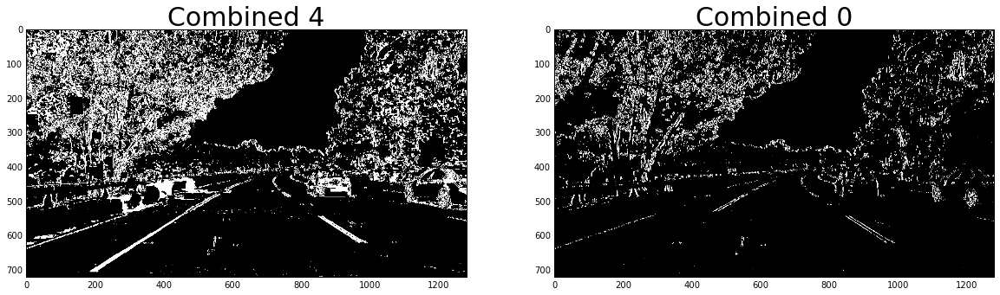

In [43]:
# Visualize combined
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10));
ax1.imshow(combined4, cmap='gray');
ax1.set_title('Combined 4', fontsize=30);
ax2.imshow(combined0, cmap='gray');
ax2.set_title('Combined 0', fontsize=30);

In [44]:
def thresholded_binary(image):
    # sobel x
    sx_kernel = 3
    sx_thresh = (20, 100)
    sx_binary = sobel_abs_thresholds(image, orient='x', kernel_size=sx_kernel, thresholds=sx_thresh)
    # sobel y
    sy_kernel = 3
    sy_thresh = (30, 100)
    sy_binary = sobel_abs_thresholds(image, orient='y', kernel_size=sy_kernel, thresholds=sy_thresh)
    # sobel magnitude
    smag_kernel = 5
    smag_thresh = (30,100)
    smag_binary = sobel_magnitude_thresholds(image, kernel_size=smag_kernel, thresholds=smag_thresh)
    # sobel gradient direction
    sgraddir_kernel = 7
    sgraddir_thresh = (0.7, 1.3)
    sgraddir_binary = sobel_graddir_thresholds(image, kernel_size=sgraddir_kernel, thresholds=sgraddir_thresh)
    # HSV's S threshold
    s_thresh = (170,255)
    s_binary = hls_s_thresholds(image, thresholds=s_thresh)
    # x gradient and S threshold
    combined = np.zeros_like(sx_binary)
    combined[(s_binary == 1) | (sx_binary == 1)] = 1
    # x gradient and magnitude
    combined0 = np.zeros_like(sx_binary)
    combined0[(sx_binary == 1) & (smag_binary == 1)] = 1   
    # y gradient and grad direction
    combined3 = np.zeros_like(sy_binary)
    combined3[(sy_binary == 1) & (sgraddir_binary == 1)] = 1    
    # use previous combined, but add pixels where gradient magnitude and direction are activated
    combined2 = np.copy(combined)
    combined2[((smag_binary == 1) & (sgraddir_binary == 1))] = 1
    # combined2 OR combined3
    combined4 = np.copy(combined2)
    combined4[combined3 == 1] = 1
    # combined4 OR combined0
    combined5 = np.copy(combined4)
    combined5[combined0 == 1] = 1
    return combined5

In [45]:
thresholded_binary = thresholded_binary(image)

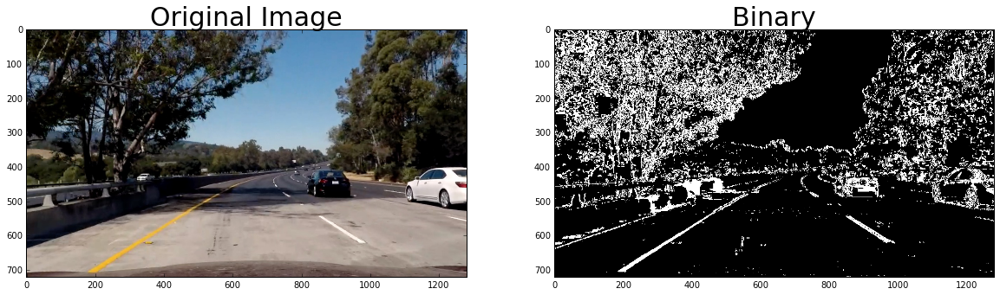

In [46]:
# Visualize combined
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10));
ax1.imshow(image);
ax1.set_title('Original Image', fontsize=30);
ax2.imshow(thresholded_binary, cmap='gray');
ax2.set_title('Binary', fontsize=30);

In [47]:
# Apply a perspective transform to rectify binary image ("birds-eye view").

In [48]:
copy = np.copy(thresholded_binary)

In [49]:
color_copy = np.dstack((copy, copy, copy))

In [50]:
src = np.float32([[85,670], 
                  [525,470], 
                  [770,470], 
                  [1195,670]])

pts = np.array(src)

In [51]:
cv2.fillPoly(color_copy, np.int_([pts]), (0,255,0));

In [52]:
result = cv2.addWeighted(image, 1, color_copy, 0.3, 0)

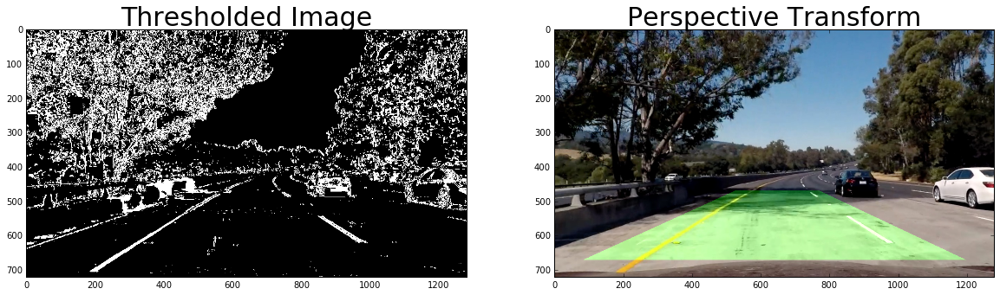

In [53]:
# Visualize
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10));
ax1.imshow(copy, cmap='gray');
ax1.set_title('Thresholded Image', fontsize=30);
ax2.imshow(result);
ax2.set_title('Perspective Transform', fontsize=30);

In [54]:
cv2.imwrite('test_images/test5_poly.jpg',result)

True

In [55]:
# Does perspective transform for the part of the road between lanes.
# Takes undistorted image
# Returns transfromed image, the matrix used to transform it and the matrix for inverse transform
def perspective_transform(img, M=None, Minv=None):
    imshape = img.shape
    
    if (M is None):
        src = np.float32([[85,670], 
                          [530,470], 
                          [765,470], 
                          [1195,670]])
        dst = np.float32([[imshape[1]*.05, imshape[0]*.95],
                          [imshape[1]*.05, imshape[0]*.05],
                          [imshape[1]*.95, imshape[0]*.05],
                          [imshape[1]*.95, imshape[0]*.95]])
        M = cv2.getPerspectiveTransform(src, dst)
        Minv = cv2.getPerspectiveTransform(dst, src)

    warped = cv2.warpPerspective(img, M, (imshape[1], imshape[0]), flags=cv2.INTER_LINEAR)
    return warped, M, Minv

In [56]:
top_down_binary, M, Minv = perspective_transform(thresholded_binary)

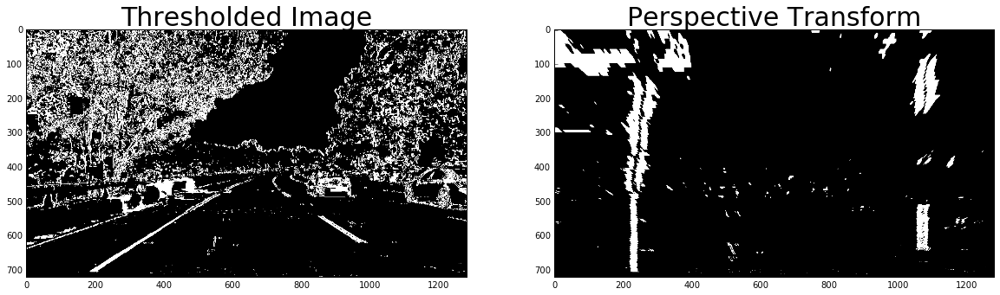

In [57]:
# Visualize
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10));
ax1.imshow(thresholded_binary, cmap='gray');
ax1.set_title('Thresholded Image', fontsize=30);
ax2.imshow(top_down_binary, cmap='gray');
ax2.set_title('Perspective Transform', fontsize=30);

In [58]:
#Detect lane pixels and fit to find lane boundary.

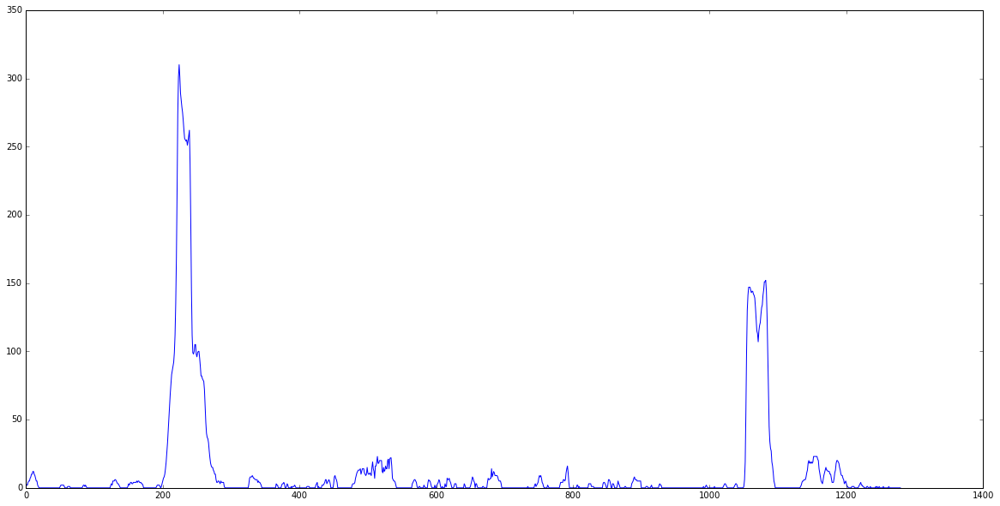

In [59]:
histogram = np.sum(top_down_binary[int(top_down_binary.shape[0]/2):,:], axis=0) 
plt.plot(histogram);

In [60]:
max(histogram)

310

In [61]:
histogram

array([3, 2, 2, ..., 0, 0, 0], dtype=uint64)

In [62]:
imax1 = np.argmax(histogram)

In [63]:
b = np.copy(histogram)
b[imax1-int(len(histogram)/20) : imax1+int(len(histogram)/20)] = 0

In [64]:
len(b)

1280

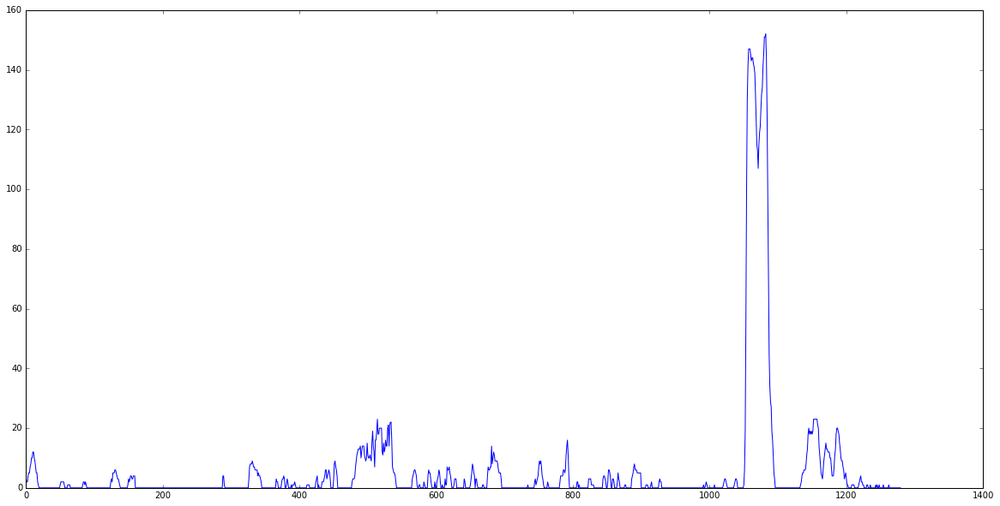

In [65]:
plt.plot(b);

In [67]:
histogram1 = np.concatenate([histogram[0:imax1-int(len(histogram)/20)], histogram[imax1+int(len(histogram)/20):]])

In [68]:
len(histogram1)

1152

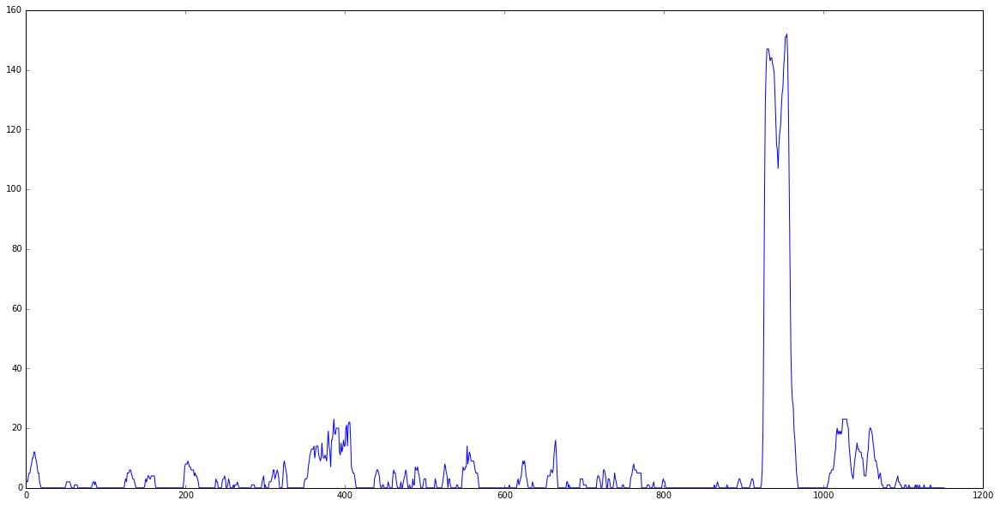

In [69]:
plt.plot(histogram1);

In [70]:
imax2 = np.argmax(histogram1)

In [71]:
imax2

954

In [102]:
# given binary top-down view of lane pixels find possible left and right x values, in pixels
# using histogram method
#    inputs:
#       image                           -- binary image with top-down (perspective-transformed) view of lane lines
#       pct_image_width_lane_width_max  -- pct width of total image that one lane can occupy. used to decide on histograms
#    outputs:
#        left_lane_x_px                 -- initial estimate for left lane x coordinate or None
#        right_lane_x_px                -- initial estimate for right lane x coordinate or None
def find_left_right_x(image, pct_image_width_lane_width_max=0.1):
    # build histogram of lower half of the image, closer to the car -- lines should be more straight
    histogram1 = np.sum(image, axis=0)
    # find the most prominent peak in the histogram
    imax1 = np.argmax(histogram1)
    max1 = histogram1[imax1]
    # remove the peak and pct_image_width_lane_width_max elements around it.
    histogram2 = np.copy(histogram1)
    histogram2[imax1-int(len(histogram)*pct_image_width_lane_width_max/2.0) : imax1+int(len(histogram)*pct_image_width_lane_width_max/2.0)] = 0
    # find second highest peak
    imax2 = np.argmax(histogram2)
    max2 = histogram2[imax2]
    # remove the second peak and pct_image_width_lane_width_max elements around it.
    histogram3 = np.copy(histogram2)
    histogram3[imax2-int(len(histogram)*pct_image_width_lane_width_max/2.0) : imax2+int(len(histogram)*pct_image_width_lane_width_max/2.0)] = 0
    # find second highest peak
    imax3 = np.argmax(histogram3)
    max3 = histogram3[imax3]
    
    l = min(imax1, imax2)
    r = max(imax1, imax2)
    
    # decide what kind of situation we have
    if max1/max3<1.5:
        # inconsequential difference between topmost peak and the 'background'
        return None, None
    if max2/max3<1.5:
        # inconsequential difference between second peak and the 'background'
        return None if max2==l else l, None if max2==r else r
    return l, r

In [103]:
(height, width) = top_down_binary.shape

In [114]:
pct_image_width_lane_width_max=0.1
nx = int(width*pct_image_width_lane_width_max)
# only use bottom half of the image
lx, rx = find_left_right_x(top_down_binary[int(height/2):,:], pct_image_width_lane_width_max=pct_image_width_lane_width_max)

In [115]:
lx, rx

(224, 1082)

In [116]:
pct_image_height_slice=0.1

In [117]:
ny = int(height*pct_image_height_slice)

In [135]:
nx, ny

(128, 72)

In [169]:
for i in range(len(y_points)-1,0,-1):
    print(i, y_points[i])

9 720
8 648
7 576
6 504
5 432
4 360
3 288
2 216
1 144


In [181]:
y_points=np.arange(ny,height+1,ny)
x_points=np.zeros_like(y_points)
x_points[-1] = lx
for i in range(len(y_points)-1,0,-1):
    slice_y_bottom = y_points[i]
    slice_y_top = slice_y_bottom - ny
    imgslice = top_down_binary[slice_y_top:slice_y_bottom,:]
    ones = np.zeros_like(imgslice)
    slice_x_bottom = x_points[i]
    ones[:,slice_x_bottom-int(nx/2):slice_x_bottom+int(nx/2)] = 1
    imgslice2 = np.bitwise_and(imgslice, ones)
    (x,y)=np.nonzero(imgslice2) # x and y are here in the 'opposite' order
    if (len(x)>10):
        p = np.polyfit(x, y, 2)
        slice_x_top = np.polyval(p, 0)
    else:
        slice_x_top = slice_x_bottom
    x_points[i-1] = slice_x_top
p = np.polyfit(y_points, x_points, 2)
ally = range(0,height)
allx = np.polyval(p, ally)


In [182]:
x_points

array([204, 248, 266, 237, 246, 235, 226, 234, 231, 224])

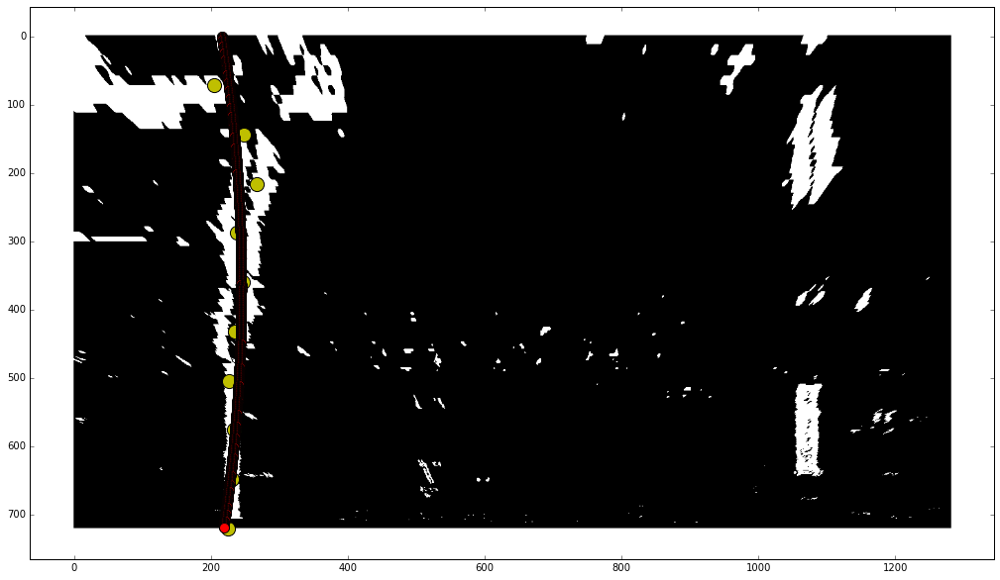

In [185]:
plt.imshow(top_down_binary, cmap='gray');
plt.scatter(x_points, y_points, c='y', s=200);
plt.scatter(allx, ally, c='r', s=100);


In [137]:
slice_y_bottom = height-1
slice_y_top = slice_y_bottom - ny
imgslice = top_down_binary[slice_y_top:slice_y_bottom,:]


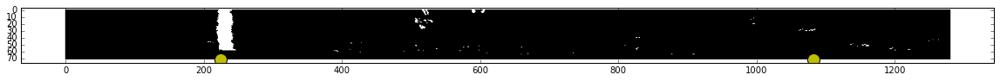

In [151]:
plt.imshow(imgslice, cmap='gray');
plt.scatter(lx, ny, c='y', s=200);
plt.scatter(rx, ny, c='y', s=200);

In [139]:
ones = np.zeros_like(imgslice)
slice_x_bottom = lx
ones[:,slice_x_bottom-int(nx/2):slice_x_bottom+int(nx/2)] = 1
imgslice2 = np.bitwise_and(imgslice, ones)

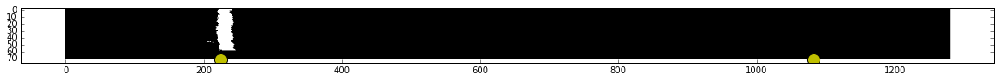

In [152]:
plt.imshow(imgslice2, cmap='gray');
plt.scatter(lx, ny, c='y', s=200);
plt.scatter(rx, ny, c='y', s=200);

In [141]:
(x,y)=np.nonzero(imgslice2) # x and y are here in the 'opposite' order

In [127]:
len(x)

1210

In [146]:
np.unique(y)

array([206, 207, 209, 210, 213, 218, 219, 220, 221, 222, 223, 224, 225,
       226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238,
       239, 240, 241, 242, 243, 244, 245, 246])

In [147]:
p = np.polyfit(x, y, 2)

In [148]:
p

array([  2.53268000e-03,  -1.18967612e-01,   2.31230780e+02])

In [149]:
slice_x_top = np.polyval(p, 0)

In [150]:
slice_x_top

231.23077951289835

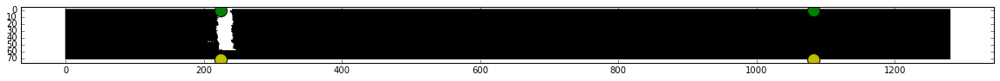

In [153]:
plt.imshow(imgslice2, cmap='gray');
plt.scatter(lx, ny, c='y', s=200);
plt.scatter(rx, ny, c='y', s=200);
plt.scatter(lx, 0, c='g', s=200);
plt.scatter(rx, 0, c='g', s=200);

In [ ]:
# Once you have implemented a successful pipeline on the test images,
# you will run your algorithm on a video. 
# In the case of the video, you must search for the lane lines in the first few frames, and, 
# once you have a high-confidence detection, 
# use that information to track the position and curvature of the lines from frame to frame.